# Hyperz SED Fitting Results

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
path = r'/home/chris/Documents/ZPHOT1.3/src/'

In [3]:
# small subset of larger catalogue which was used in hyperz for
# time efficiency.
df = pd.read_csv('subset_4051.csv', index_col=0)
df.head()

,z,t/Gyr,M*,VIS,NISP_Y,NISP_J,NISP_H,LSST_u,LSST_g,LSST_r,...,2MASS_Ks,wircam_Ks,M_initial,Z,SFH,tau/Gyr,Av_law,Av,t_l,physical
925475,5.36,0.01,0.9128,27.2677,25.8091,25.3337,24.9579,32.8884,31.2726,28.3088,...,24.6984,24.7020,1.000000e+10,0.3,1.0,0.1,1.0,0.8,12.700636,True
86139,1.96,0.80,0.6776,29.6252,27.8035,26.5675,25.6417,32.2674,30.9611,30.0527,...,24.9591,24.9713,1.000000e+10,0.0,1.0,3.0,1.0,1.0,10.427619,True
340793,0.26,7.00,0.5464,27.9727,24.7910,23.4551,22.3137,37.2184,32.9626,29.7347,...,21.5998,21.6078,1.000000e+10,0.0,1.0,1.0,1.0,1.6,3.126385,True
967092,0.83,0.10,0.7879,19.7992,19.8492,19.8144,19.5259,19.5824,19.7150,19.8901,...,19.4702,19.4699,1.000000e+10,0.3,1.0,1.0,0.0,0.0,7.158495,True
1447538,3.30,0.06,0.8168,38.7796,35.4560,33.7999,31.5068,51.5970,43.8688,40.4406,...,30.0605,30.0766,1.000000e+10,0.3,1.0,3.0,1.0,1.6,11.846391,True


In [4]:
dt_all = np.loadtxt('ugrizVISYJH4051.cat')

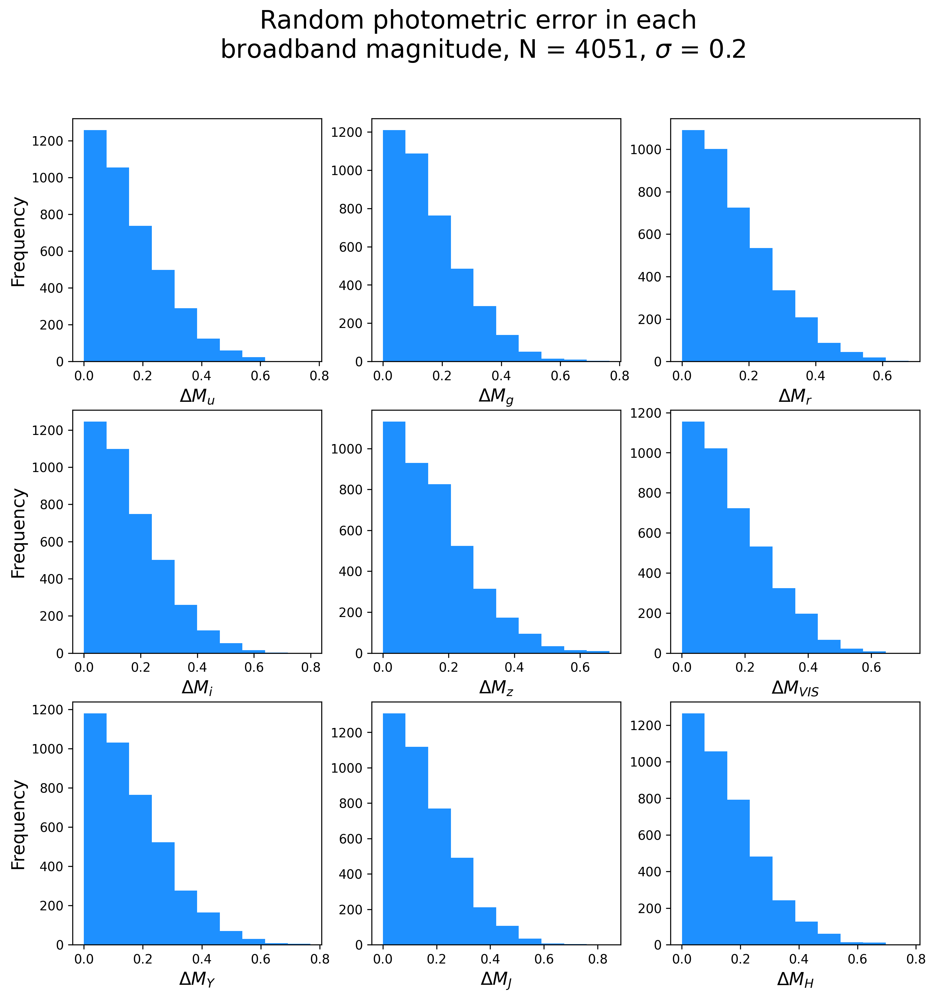

In [5]:
photo_bands = ('u', 'g', 'r', 'i', 'z', 'VIS', 'Y', 'J', 'H')
plt.figure(figsize=(12, 12), dpi=300)
plt.suptitle('Random photometric error in each \nbroadband magnitude, N = %i, $\sigma$ = 0.2' % len(df), fontsize=20)

for i in range(0, 9):   

    plt.subplot(331+i)
    if i == 0 or i == 3 or i == 6: plt.ylabel('Frequency', fontsize=14)
    plt.xlabel(r'$\Delta M_{%s}$' % photo_bands[i], fontsize=14)

    plt.hist(dt_all[:, i+10], color='dodgerblue')
    
#plt.savefig('4051_figs/mag_err.png', dpi=300, transparent=False, format='png')

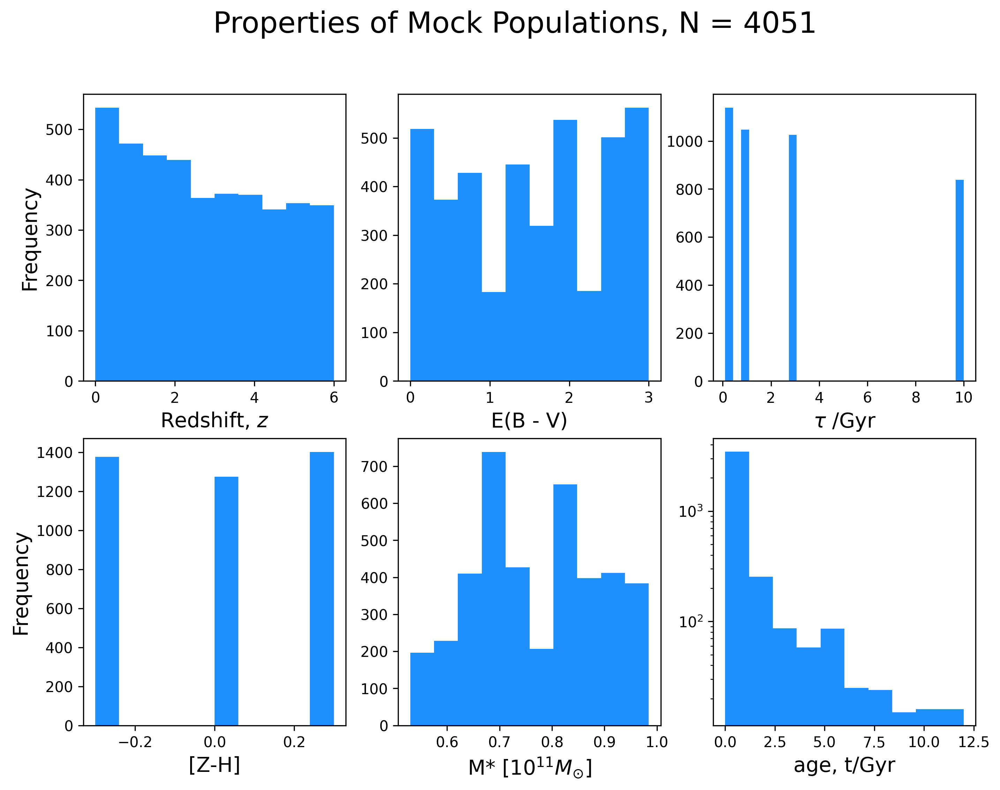

In [6]:
gal_params = ('z', 'Av', 'tau/Gyr', 'Z', 'M*', 't/Gyr')
units_params = (r'Redshift, $z$', 'E(B - V)',
                r'$\tau$ /Gyr', '[Z-H]',
                r'M* [$10^{11} M_{\odot}$]', 'age, t/Gyr')

plt.figure(figsize=(11, 8), dpi=300)
plt.suptitle('Properties of Mock Populations, N = %i' % len(df),
             fontsize=20)

for i in range(0, 6):   
    if i == 5 : log = True
    else : log = False    
    
    if i == 2 : bins = 30
    else : bins = None
    
    plt.subplot(231+i)
    
    if i == 0 or i == 3 : plt.ylabel('Frequency', fontsize=14)
    plt.xlabel(units_params[i], fontsize=14)

    plt.hist(df[gal_params[i]], color='dodgerblue', log=log, bins=bins)
#plt.savefig('4051_figs/data_summary.png', dpi=300, transparent=False, format='png')

# Results

In [7]:
all_zphot = np.loadtxt(path + 'result_all_4051/result_ugrizVISYJH_4051.z_phot')
grizVISYJH_zphot = np.loadtxt(path + 'result_grizVISYJH_4051/result_grizVISYJH_4051.z_phot')
ugriz_zphot = np.loadtxt(path + 'result_ugriz_4051/result_ugriz_4051.z_phot')
VISYJH_zphot = np.loadtxt(path + 'result_VISYJH_4051/result_VISYJH_4051.z_phot')
YJH_zphot = np.loadtxt(path + 'result_YJH_4051/result_YJH_4051.z_phot')
ugrizYJH_zphot = np.loadtxt(path + 'result_ugrizYJH_4051/result_ugrizYJH_4051.z_phot')

In [8]:
titleCmap = 'Av'
varCmap = df[titleCmap]

In [9]:
filterset_list = (r'ugriz $VIS$ YJH',
               r'griz $VIS$ YJH',
               'YJH',
               'ugriz',
               'ugriz YJH',
               r'$VIS$ YJH')

zphot_3d    = np.dstack([all_zphot, 
                         grizVISYJH_zphot,
                         YJH_zphot,
                         ugriz_zphot,
                         ugrizYJH_zphot,
                         VISYJH_zphot])
print(zphot_3d.shape)

(4051, 21, 6)


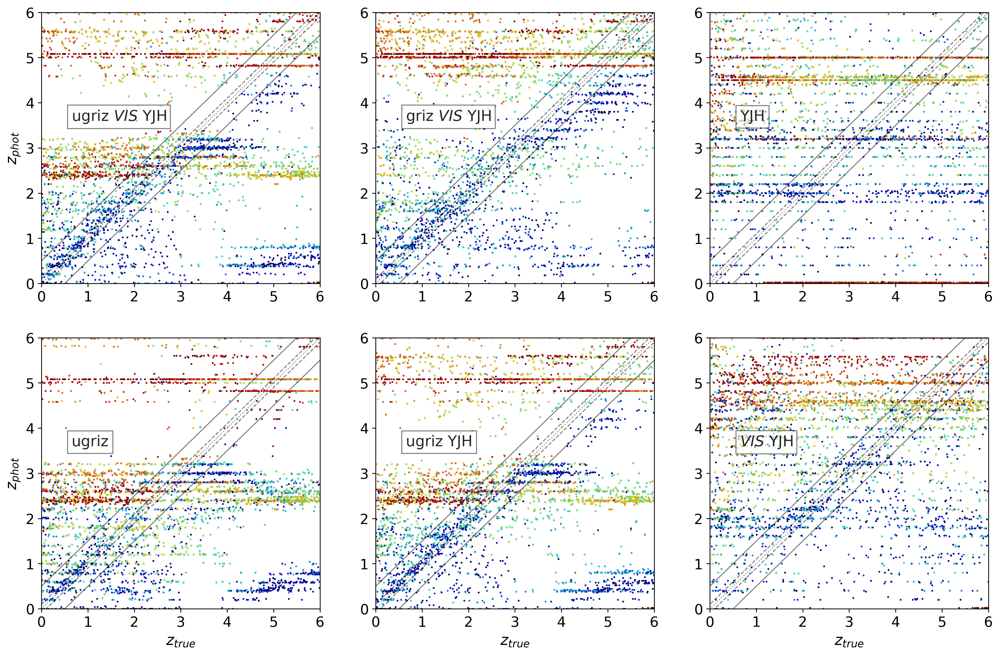

In [10]:
plt.figure(figsize=(17, 11), dpi=300)
for i in range(0, 6):
    plt.subplot(231+i)
    
    plt.plot([-6., 9.5], [-5.5, 10.],'k', alpha=0.5, lw=1)
    plt.plot([-6., 9.9], [-5.9, 10.],'k--', alpha=0.5, ls='--', lw=1)
    plt.plot([-6., 10.], [-6, 10.], ':k', alpha=0.5, ls=':', lw=1)
    plt.plot([-6., 10.1], [-6.1, 10.],'k--', alpha=0.5, ls='--', lw=1)
    plt.plot([-6., 10.5], [-6.5, 10.],'k', alpha=0.5, lw=1)
    
    plt.scatter(df['z'], zphot_3d[:, 1, i], s=3, c=varCmap, cmap='jet', edgecolors='k', lw=0.1)
#    cbar = plt.colorbar(shrink=0.95)
#    cbar.set_label(titleCmap, fontsize=14)
    plt.text(0.65, 3.6, (filterset_list[i]), c='k', fontsize=15, alpha=0.85, bbox=dict(facecolor='w', alpha=0.5))

    if (i % 3) == 0 : plt.ylabel((r'$z_{phot}$'),
                                 fontsize=15)
    if i >= 3 : plt.xlabel((r'$z_{true}$'),
                              fontsize=15)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.ylim(0, 6)
    plt.xlim(0, 6)

#plt.savefig('4051_figs/photoz_Av_l.png', dpi=300, transparent=False, format='png')
plt.show()

### w/o cmap

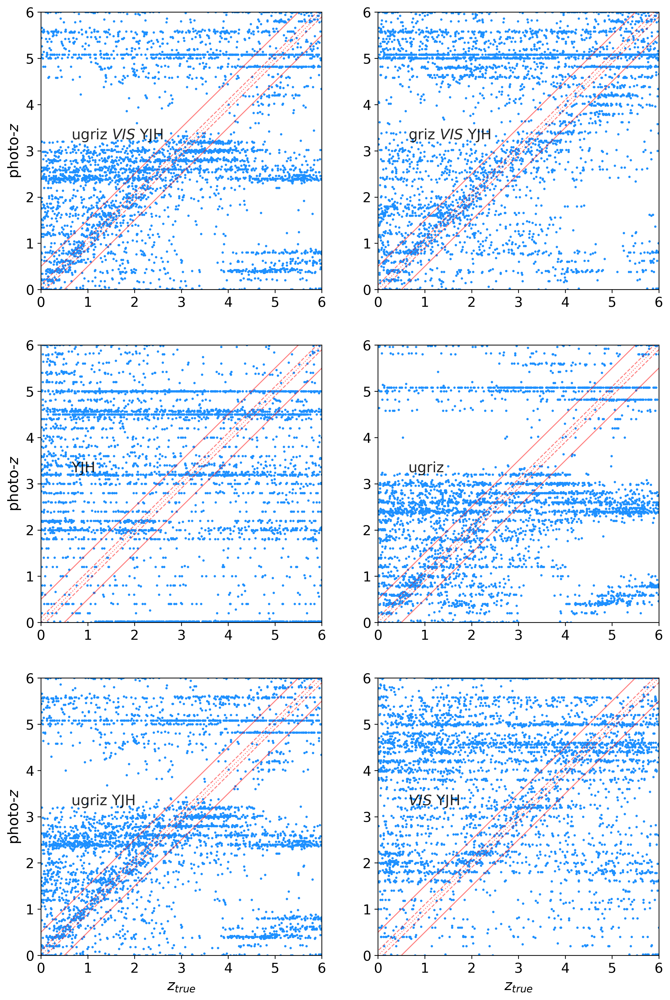

In [11]:
plt.figure(figsize= (11.5, 18), dpi=300)
for i in range(0, 6):
    plt.subplot(321+i)
    

    plt.plot([-6., 9.5], [-5.5, 10.],'r', alpha=0.5, lw=1)
    plt.plot([-6., 9.9], [-5.9, 10.],'r--', alpha=0.5, ls='--', lw=1)
    plt.plot([-6., 10.], [-6, 10.], ':r', alpha=0.5, ls=':', lw=1)
    plt.plot([-6., 10.1], [-6.1, 10.],'r--', alpha=0.5, ls='--', lw=1)
    plt.plot([-6., 10.5], [-6.5, 10.],'r', alpha=0.5, lw=1)
    
    plt.scatter(df['z'], zphot_3d[:, 1, i], s=2, c='dodgerblue')
    plt.text(0.65, 3.25, (filterset_list[i]), c='k', fontsize=15, alpha=0.85, )

    if (i % 2) == 0 : plt.ylabel((r'photo-$z$'),
                                 fontsize=15)
    if i >= 4 : plt.xlabel((r'$z_{true}$'),
                              fontsize=15)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.ylim(0, 6)
    plt.xlim(0, 6)
plt.show()

In [12]:
titleCmap = 'Av'

In [13]:
mycolor = df[titleCmap]

In [73]:
z_true = df['z'].values

all_mask = np.argwhere(all_zphot[:, 1] != 99)
VISYJH_mask = np.argwhere(VISYJH_zphot[:, 1] != 99)
grizVISYJH_mask = np.argwhere(grizVISYJH_zphot[:, 1] != 99)

del_z_all = (all_zphot[:, 1] - z_true)/(1+z_true)
del_z_grizVISYJH = (grizVISYJH_zphot[:, 1] - z_true)/(1+z_true)
del_z_VISYJH = (VISYJH_zphot[:, 1] - z_true)/(1+z_true)

all_std = np.std(del_z_all[all_mask])
grizVISYJH_std = np.std(del_z_grizVISYJH[grizVISYJH_mask])
VISYJH_std = np.std(del_z_VISYJH[VISYJH_mask])

In [74]:
all_std_av = np.std(del_z_all[av_mask])
grizVISYJH_av_std = np.std(del_z_grizVISYJH[av_mask])
VISYJH_std_av = np.std(del_z_VISYJH[av_mask])

In [76]:
print(all_std, grizVISYJH_std, VISYJH_std)
print(all_std_av, grizVISYJH_av_std, VISYJH_std_av)

0.8992585202367743 1.0703904809032125 1.0868137746979287
4.619166037042682 4.628687743733748 4.66267191831099


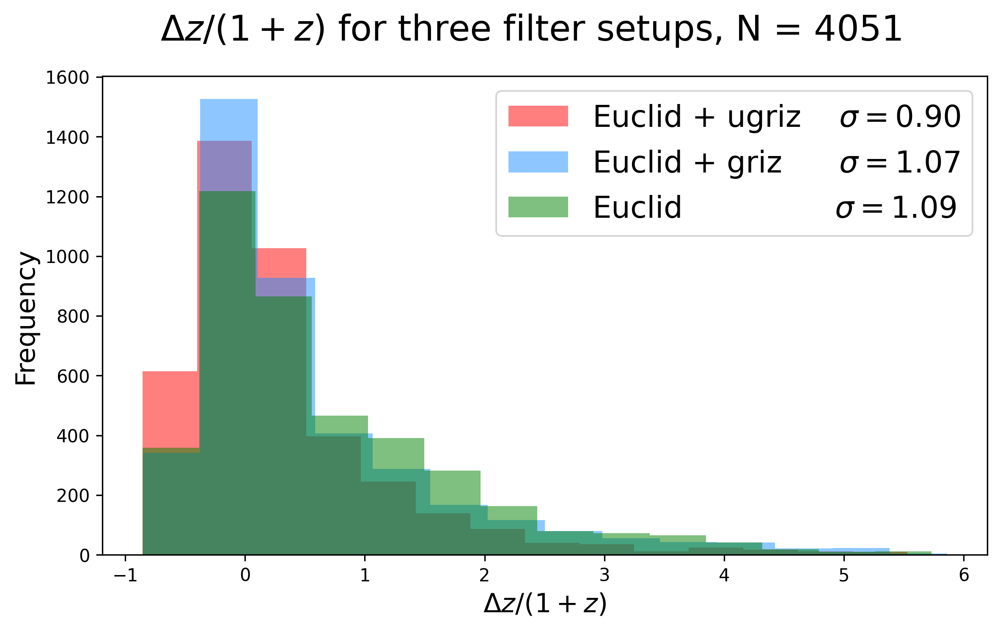

In [15]:
plt.figure(figsize=(9,5), dpi=300)

plt.suptitle(r'$\Delta z / (1 + z)$ for three filter setups, N = %i' % len(df),
             fontsize=20)
plt.hist(del_z_all[all_mask], bins=14, color='r',
         alpha=0.5, label=(r'Euclid + ugriz    $\sigma = $%.2f' % all_std))
plt.hist(del_z_grizVISYJH[grizVISYJH_mask], bins=14, alpha=0.5, color='dodgerblue', label=(r'Euclid + griz      $\sigma = $%.2f' % grizVISYJH_std))
plt.hist(del_z_VISYJH[VISYJH_mask], bins=14, alpha=0.5, color='g', label=(r'Euclid                $\sigma = $%.2f' % VISYJH_std))
plt.xlabel(r'$\Delta z / (1 + z)$', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.legend(fontsize=17)

#plt.savefig('4051_figs/photoz_3filt.png', dpi=300, transparent=False, format='png')

In [16]:
print('Undetected objects/no solutions for Euclid + ugriz =', len(df)-len(all_mask))
print('Undetected objects/no solutions for Euclid + griz =',len(df)-len(grizVISYJH_mask))
print('Undetected objects/no solutions for Euclid =',len(df)-len(VISYJH_mask))

Undetected objects/no solutions for Euclid + ugriz = 7
Undetected objects/no solutions for Euclid + griz = 8
Undetected objects/no solutions for Euclid = 8


(0.0, 6.0)

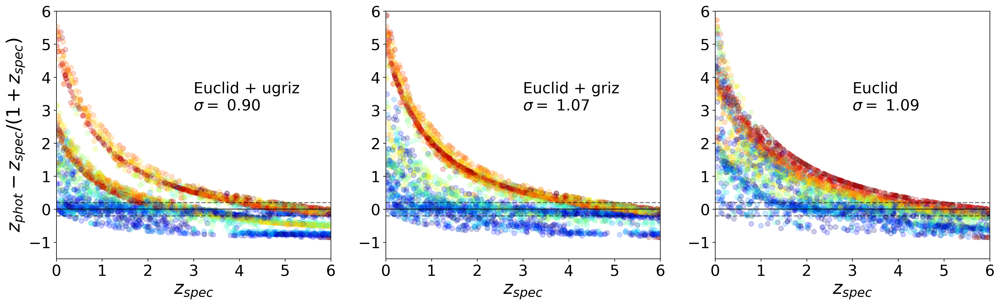

In [17]:
plt.figure(figsize=(22,6), dpi=300)
#plt.suptitle(r'$z_{phot}$ accuracy, N = %i' % len(df), fontsize=20)
plt.subplot(131)


plt.scatter(z_true, del_z_all, s=40,
            c=varCmap,
            alpha=0.2,
            cmap='jet'
           )

plt.plot([0, 6], [0.2, 0.2], c='k', alpha=0.5, ls='--')
plt.plot([0, 6], [0, 0], c='k', alpha=0.5, lw= 2)
plt.plot([0, 6], [-0.2, -0.2], c='k', alpha=0.5, ls='--')
#cbar = plt.colorbar(shrink=0.95)
#cbar.set_label(titleCmap, fontsize=18)

plt.text(3, 3, 'Euclid + ugriz\n$\sigma =$ %.2f' % all_std, c='k', fontsize=20)

plt.xlabel('$z_{spec}$', fontsize=24)
plt.ylabel(r'$z_{phot} - z_{spec}/(1 + z_{spec})$', fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(-1.5, 6)
plt.xlim(0, 6)

plt.subplot(132)

plt.scatter(z_true, del_z_grizVISYJH, s=40,
            c=varCmap,
            alpha=0.2,
            cmap='jet'
           )

plt.plot([0, 6], [0.2, 0.2], c='k', alpha=0.5, ls='--')
plt.plot([0, 6], [0, 0], c='k', alpha=0.5, lw= 2)
plt.plot([0, 6], [-0.2, -0.2], c='k', alpha=0.5, ls='--')

#cbar = plt.colorbar(shrink=0.95)
#cbar.set_label(titleCmap, fontsize=18)
plt.text(3, 3, 'Euclid + griz\n$\sigma =$ %.2f' % grizVISYJH_std, c='k', fontsize=20)


plt.xlabel('$z_{spec}$', fontsize=24)
#plt.ylabel(r'$z_{phot} - z_{spec}/(1 + z_{spec})$', fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(-1.5, 6)
plt.xlim(0, 6)


plt.subplot(133)

plt.scatter(z_true, del_z_VISYJH, s=40,
            c=varCmap,
            alpha=0.2, 
            cmap='jet'
           )
plt.plot([0, 6], [0.2, 0.2], c='k', alpha=0.5, ls='--')
plt.plot([0, 6], [0, 0], c='k', alpha=0.5, lw= 2)
plt.plot([0, 6], [-0.2, -0.2], c='k', alpha=0.5, ls='--')
#cbar = plt.colorbar(shrink=0.95)
#cbar.set_label(titleCmap, fontsize=18)
plt.text(3, 3, 'Euclid\n$\sigma =$ %.2f' % VISYJH_std, c='k', fontsize=20)

plt.xlabel('$z_{spec}$', fontsize=24)
#plt.ylabel(r'$z_{phot} - z_{spec}/(1 + z_{spec})$', fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(-1.5, 6)
plt.xlim(0, 6)

#plt.savefig('4051_figs/photoz_Av_alt_l.png', transparent=False, dpi=300, format='png')

In [18]:
print(len(np.argwhere(abs(del_z_all[all_mask]) < 0.05))/len(del_z_all[all_mask]))
print(len(np.argwhere(abs(del_z_grizVISYJH[grizVISYJH_mask]) < 0.05))/len(del_z_grizVISYJH[grizVISYJH_mask]))
print(len(np.argwhere(abs(del_z_VISYJH[VISYJH_mask]) < 0.05))/len(del_z_VISYJH[VISYJH_mask]))

0.1102868447082097
0.11377689834281474
0.10116250309176354


In [19]:
av_df = df['Av'].values

av_mask = np.argwhere(av_df <= 2.)
av_mask.shape

(2803, 1)

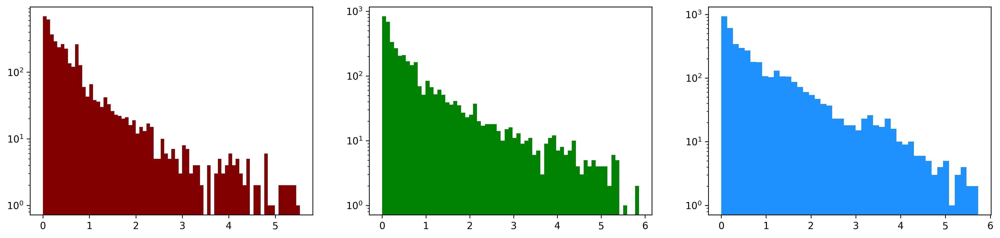

In [20]:
plt.figure(figsize=(18,4), dpi=300)
plt.subplot(131)
plt.hist(abs(del_z_all[all_mask]), bins='fd', log=True, color='maroon')

plt.subplot(132)
plt.hist(abs(del_z_grizVISYJH[grizVISYJH_mask]), bins='fd', log=True, color='g')

plt.subplot(133)
plt.hist(abs(del_z_VISYJH[VISYJH_mask]), bins='fd', log=True, color='dodgerblue')
plt.show()

In [21]:
print(len(np.argwhere(abs(del_z_all[av_mask]) < 0.05))/len(del_z_all[av_mask]))
print(len(np.argwhere(abs(del_z_grizVISYJH[av_mask]) < 0.05))/len(del_z_grizVISYJH[av_mask]))
print(len(np.argwhere(abs(del_z_VISYJH[av_mask]) < 0.05))/len(del_z_VISYJH[av_mask]))

0.11880128433820906
0.12593649661077416
0.10916874777024617


In [22]:
goal = 1
print(len(np.argwhere(abs(del_z_all[av_mask]) < goal))/len(del_z_all[av_mask]))
print(len(np.argwhere(abs(del_z_grizVISYJH[av_mask]) < goal))/len(del_z_grizVISYJH[av_mask]))
print(len(np.argwhere(abs(del_z_VISYJH[av_mask]) < goal))/len(del_z_VISYJH[av_mask]))

0.8976097038886907
0.864430966821263
0.7766678558687121


In [23]:
all_sol1_ind = []
all_sol2_ind = []
for i in range(len(df)):
    if ( abs(z_true[i] - all_zphot[i, 1]) )  > ( abs(z_true[i] - all_zphot[i, -2]) ):
        all_sol2_ind.append(i)
    else: all_sol1_ind.append(i)

In [24]:
len(all_sol2_ind)

1827

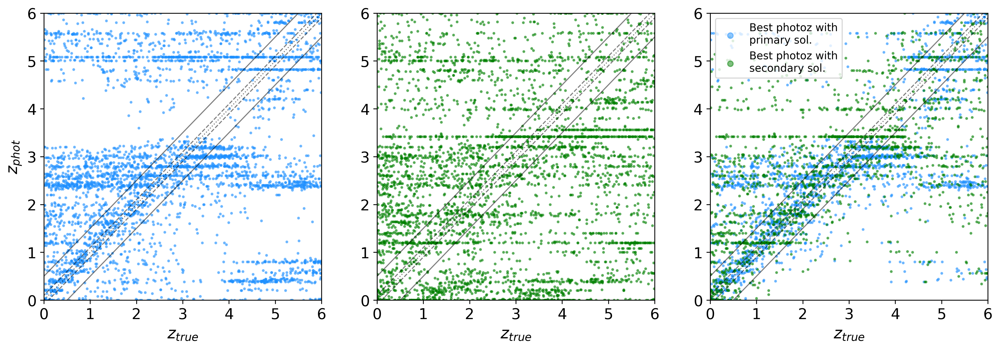

In [25]:

plt.figure(figsize= (16,5), dpi=300)
plt.subplot(131)
plt.plot([-6., 9.5], [-5.5, 10.],'k', alpha=0.5, lw=1)
plt.plot([-6., 9.9], [-5.9, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.], [-6, 10.], ':k', alpha=0.5, ls=':', lw=1)
plt.plot([-6., 10.1], [-6.1, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.5], [-6.5, 10.],'k', alpha=0.5, lw=1)

plt.scatter(z_true[:], all_zphot[:, 1], c='dodgerblue', s=3, alpha=0.5)
#    plt.text(0.65, 3.25, (filterset_list[i]), c='k', fontsize=15, alpha=0.85, )
plt.xlabel((r'$z_{true}$'), fontsize=15)
plt.ylabel((r'$z_{phot}$'), fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylim(0, 6)
plt.xlim(0, 6)
plt.subplot(132)
plt.plot([-6., 9.5], [-5.5, 10.],'k', alpha=0.5, lw=1)
plt.plot([-6., 9.9], [-5.9, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.], [-6, 10.], ':k', alpha=0.5, ls=':', lw=1)
plt.plot([-6., 10.1], [-6.1, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.5], [-6.5, 10.],'k', alpha=0.5, lw=1)

plt.scatter(z_true[:], all_zphot[:, -2], c='g', s=3, alpha=0.5)
#    plt.text(0.65, 3.25, (filterset_list[i]), c='k', fontsize=15, alpha=0.85, )
plt.xlabel((r'$z_{true}$'), fontsize=15)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylim(0, 6)
plt.xlim(0, 6)
plt.subplot(133)
plt.plot([-6., 9.5], [-5.5, 10.],'k', alpha=0.5, lw=1)
plt.plot([-6., 9.9], [-5.9, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.], [-6, 10.], ':k', alpha=0.5, ls=':', lw=1)
plt.plot([-6., 10.1], [-6.1, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.5], [-6.5, 10.],'k', alpha=0.5, lw=1)

plt.scatter(z_true[all_sol1_ind], all_zphot[all_sol1_ind, 1], c='dodgerblue', s=3, alpha=0.5, label='Best photoz with\nprimary sol.')
plt.scatter(z_true[all_sol2_ind], all_zphot[all_sol2_ind, -2], c='g', s=3, alpha=0.5,label='Best photoz with\nsecondary sol.' )
#    plt.text(0.65, 3.25, (filterset_list[i]), c='k', fontsize=15, alpha=0.85, )
plt.xlabel((r'$z_{true}$'), fontsize=15)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylim(0, 6)
plt.xlim(0, 6)
plt.legend(loc='upper left', markerscale=3)

plt.savefig('4051_figs/pri_sec_comp.png', transparent=False, dpi=300, format='png')
plt.show()

In [26]:
all_zphot[all_sol1_ind, -2].shape

(2224,)

In [27]:
blah = np.empty(len(all_zphot))

In [28]:
blah[all_sol1_ind] = all_zphot[all_sol1_ind, 1]
blah[all_sol2_ind] = all_zphot[all_sol2_ind, -2]
blah

array([4.02, 1.74, 1.2 , ..., 1.58, 3.22, 0.54])

(0.0, 6.0)

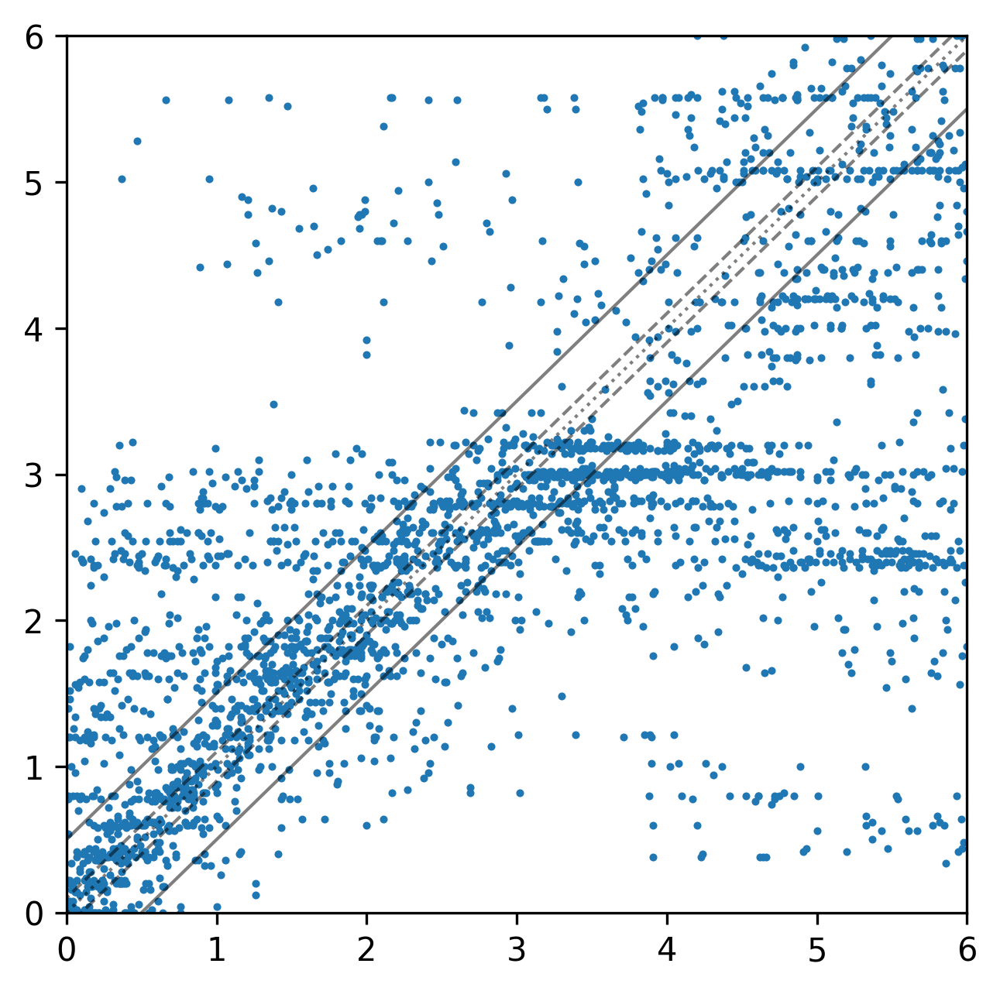

In [29]:
plt.figure(figsize=(5, 5), dpi=300)
plt.plot([-6., 9.5], [-5.5, 10.],'k', alpha=0.5, lw=1)
plt.plot([-6., 9.9], [-5.9, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.], [-6, 10.], ':k', alpha=0.5, ls=':', lw=1)
plt.plot([-6., 10.1], [-6.1, 10.],'k--', alpha=0.5, ls='--', lw=1)
plt.plot([-6., 10.5], [-6.5, 10.],'k', alpha=0.5, lw=1)
plt.scatter(z_true[av_mask], blah[av_mask], s=2)
plt.ylim(0, 6)
plt.xlim(0, 6)

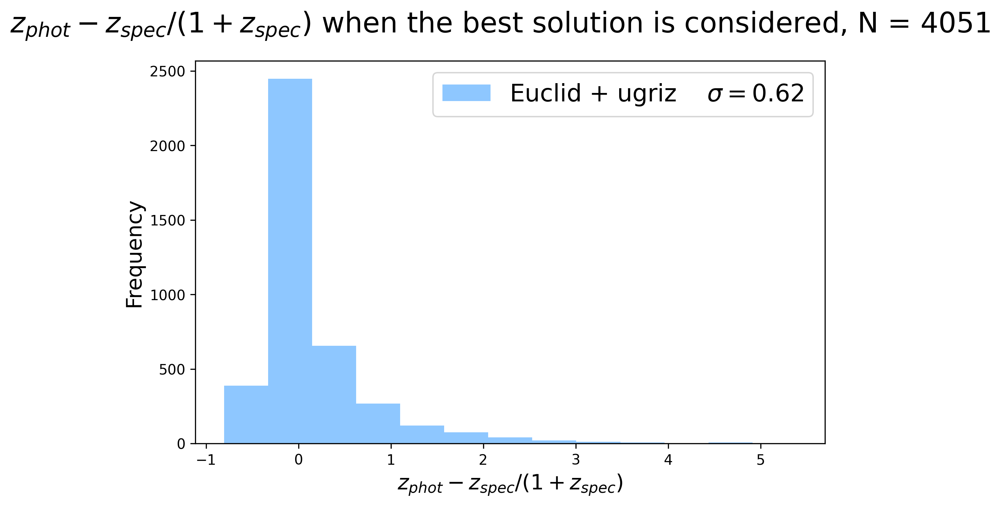

In [30]:
plt.figure(figsize=(8,5), dpi=300)

plt.suptitle(r'$z_{phot} - z_{spec}/(1 + z_{spec})$ when the best solution is considered, N = %i' % len(df),
             fontsize=20)
plt.hist(((blah[all_mask]-z_true[all_mask])/(1 + z_true[all_mask])), bins=13, color='dodgerblue',
         alpha=0.5, label=(r'Euclid + ugriz    $\sigma = $%.2f' % np.std((blah[all_mask]-z_true[all_mask])/(1 + z_true[all_mask]))))
plt.xlabel(r'$z_{phot} - z_{spec}/(1 + z_{spec})$', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.legend(fontsize=17)

#plt.savefig('4051_figs/photoz_best_sols.png', dpi=300, transparent=False, format='png', bbox_inches='tight', pad_inches=1)

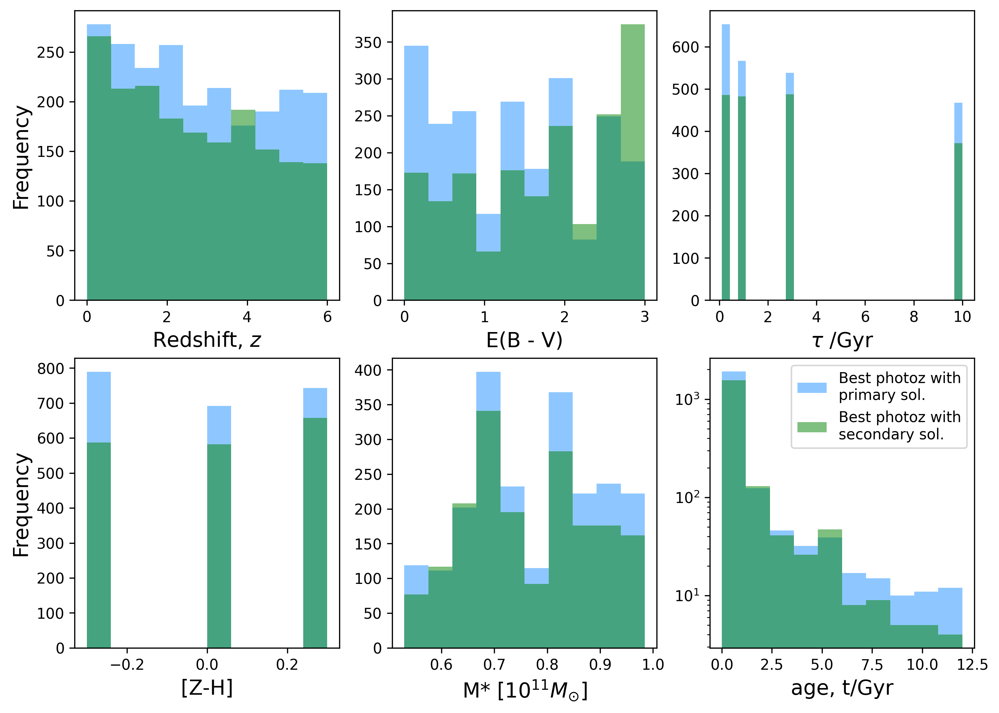

In [31]:
gal_params = ('z', 'Av', 'tau/Gyr', 'Z', 'M*', 't/Gyr')
gp_inds = ('')
units_params = (r'Redshift, $z$', 'E(B - V)',
                r'$\tau$ /Gyr', '[Z-H]',
                r'M* [$10^{11} M_{\odot}$]', 'age, t/Gyr')

plt.figure(figsize=(11, 8), dpi=300)
#plt.suptitle('Properties of Model Galaxies, N = %i' % len(df), fontsize=20)

for i in range(0, 6):   
    if i == 5 : log = True
    else : log = False    
    
    if i == 2 : 
        bins = 30
       
    else : bins = None
    
    plt.subplot(231+i)
    
    if i == 0 or i == 3 : plt.ylabel('Frequency', fontsize=14)
    plt.xlabel(units_params[i], fontsize=14)

    plt.hist(df[gal_params[i]].values[all_sol1_ind], color='dodgerblue', log=log, bins=bins, alpha=0.5, label='Best photoz with\nprimary sol.')
    plt.hist(df[gal_params[i]].values[all_sol2_ind], color='g', log=log, bins=bins, alpha=0.5, label='Best photoz with\nsecondary sol.')
plt.legend()
#plt.savefig('4051_figs/data_summary_2.png', dpi=300, transparent=False, format='png')

It seems that reddening has an affect on whether the primary or secondary solution is better. Additionally, older objects had better luck with primary sol. Lets look at the photometry.

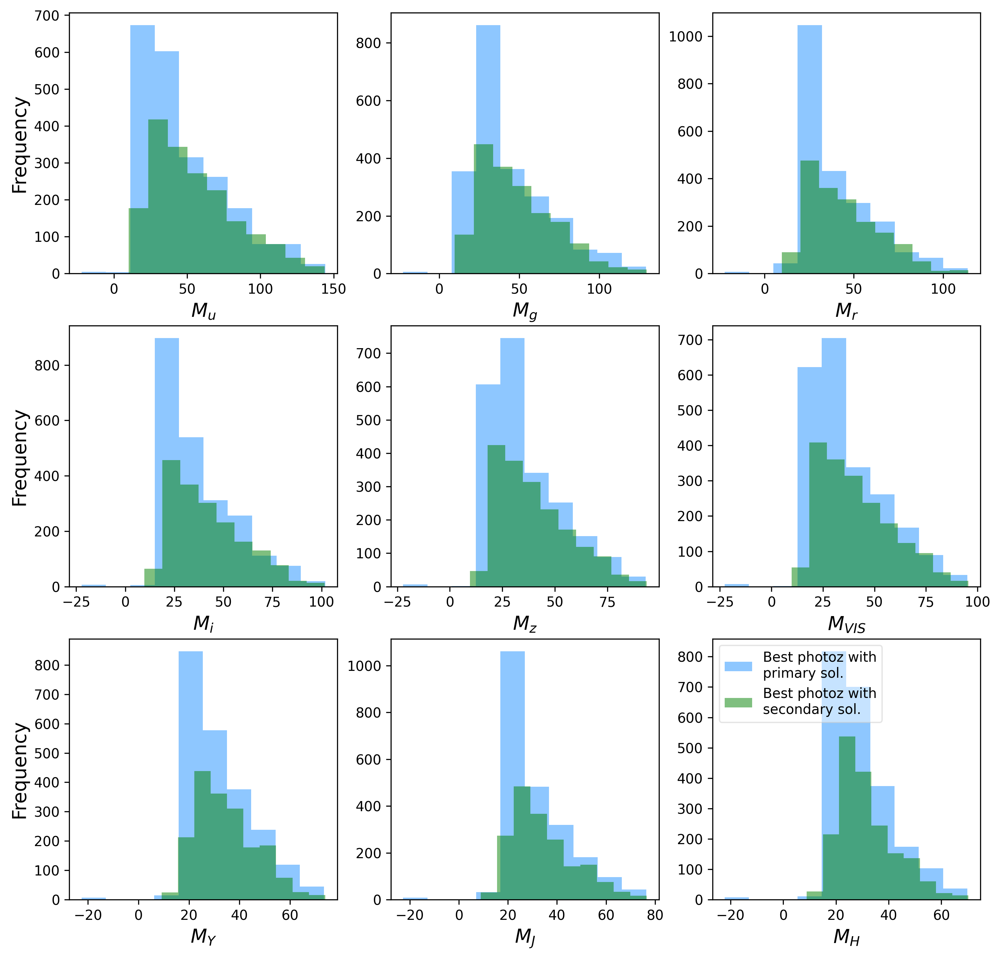

In [32]:
photo_bands = ('u', 'g', 'r', 'i', 'z', 'VIS', 'Y', 'J', 'H')
plt.figure(figsize=(12, 12), dpi=300)
#plt.suptitle('Random photometric error in each \nbroadband magnitude, N = %i, $\sigma$ = 0.2' % len(df), fontsize=20)

for i in range(0, 9):   

    plt.subplot(331+i)
    if i == 0 or i == 3 or i == 6: plt.ylabel('Frequency', fontsize=14)
    plt.xlabel(r'$M_{%s}$' % photo_bands[i], fontsize=14)

    plt.hist(dt_all[all_sol1_ind, i+1], color='dodgerblue', alpha=0.5, label='Best photoz with\nprimary sol.')
    plt.hist(dt_all[all_sol2_ind, i+1], color='g', alpha=0.5, label='Best photoz with\nsecondary sol.')
    
plt.legend(loc=2, framealpha=0.5) 
#plt.savefig('4051_figs/mag_pri_sec.png', dpi=300, transparent=False, format='png')

Interesting... Typically fainter objects have a good secondary solution. Would explain why extremely dust reddened objects show up more in this catagory, too, since this generally scales with distance. But accross the board, primary solutions are better at all mags. Doesn't seem to vary much with $\lambda$. 

We still can't identify a property which accounts for z(2) being better.

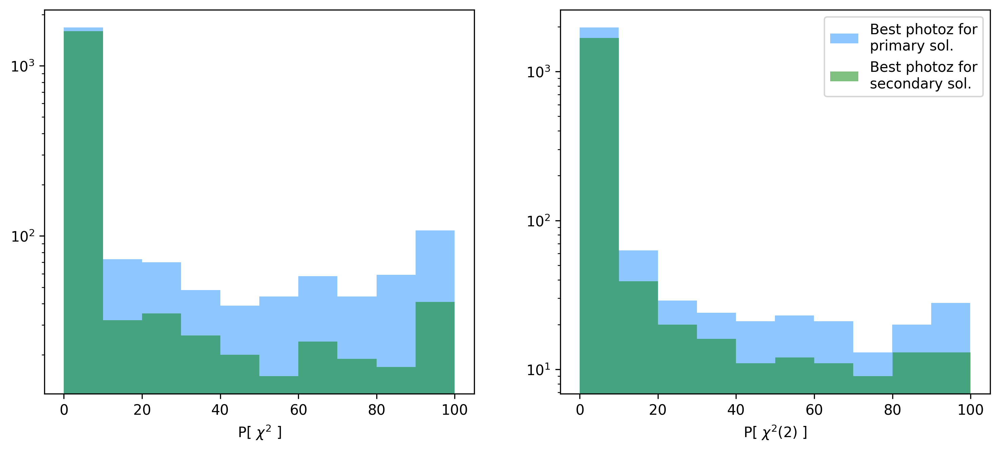

In [33]:
plt.figure(figsize=(12, 5), dpi=300)

plt.subplot(121)
plt.hist(all_zphot[all_sol1_ind, 3], color='dodgerblue', alpha=0.5, label='Best photoz for\nprimary sol.', log=True)

plt.hist(all_zphot[all_sol2_ind,3], color='g', alpha=0.5, label='Best photoz for\nsecondary sol.')
plt.xlabel(r'P[ $\chi^2$ ]')
plt.subplot(122)
plt.hist(all_zphot[all_sol1_ind, -1], color='dodgerblue', alpha=0.5, label='Best photoz for\nprimary sol.')

plt.hist(all_zphot[all_sol2_ind,-1], color='g', alpha=0.5, label='Best photoz for\nsecondary sol.', log=True)
plt.xlabel(r'P[ $\chi^2$(2) ]')
plt.legend()

Just now realising that maybe excluding solutions with fatal P [ $\chi^2$ ] might be a good idea.. However, they take up roughly half of all the data!

Alas, lets see where that gets us in terms of $\sigma_z / 1 + z$ distribution.

In [34]:
all_p_mask = np.argwhere(all_zphot[:, 2] < 10.)
all_p_mask.shape

(2074, 1)

# Other Physical Properties

In [52]:
ages = df['t/Gyr'].values

In [61]:
print( (np.mean(ages[av_mask] - all_zphot[av_mask, 6])) )
print( (np.mean(ages[av_mask] - grizVISYJH_zphot[av_mask, 6])) )
print( (np.mean(ages[av_mask] - VISYJH_zphot[av_mask, 6])) )

-0.7750668569389939
-0.3677322868355334
-0.3025986086336069


## Age

(-14.6, 14.6)

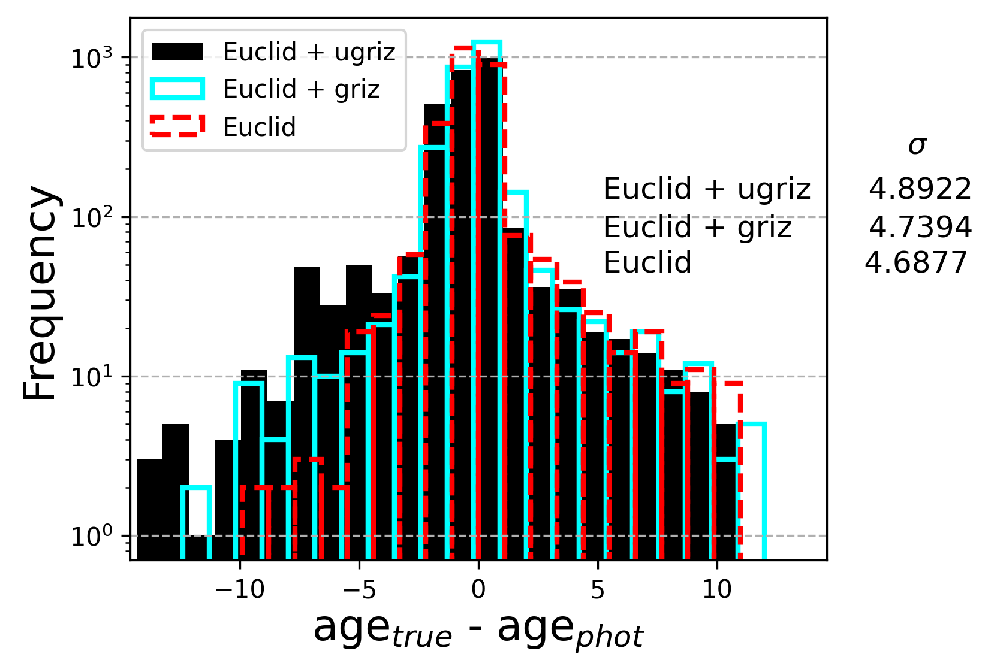

In [53]:
plt.figure(figsize=(5, 4), dpi=300)

plt.hist((ages[av_mask] - all_zphot[av_mask, 6]), bins=100, log=True, color='k', label='Euclid + ugriz')
plt.hist((ages[av_mask] - grizVISYJH_zphot[av_mask, 6]), bins=100, log=True, fill=False, edgecolor='cyan', lw=2, label='Euclid + griz')
plt.hist((ages[av_mask] - VISYJH_zphot[av_mask, 6]), bins=100, log=True, ls='--', fill=False, edgecolor='r', lw=2, label='Euclid')

plt.grid(axis='y', ls='--')
plt.legend(loc='upper left')
plt.ylabel('Frequency', fontsize=17)
plt.xlabel(r'age$_{true}$ - age$_{phot}$', fontsize=17)


plt.text(5.2, 250, ('                                $\sigma$'), c='k', fontsize=12)

plt.text(5.2, 75, (r'Euclid + griz        %.4f' % (np.std((ages[av_mask] - grizVISYJH_zphot[av_mask, 6])))), c='k', fontsize=12)

plt.text(5.2, 45, (r'Euclid                  %.4f ' % (np.std((ages[av_mask] - VISYJH_zphot[av_mask, 6])))), c='k', fontsize=12)

plt.text(5.2, 130, (r'Euclid + ugriz      %.4f ' % (np.std((ages[av_mask] - all_zphot[av_mask, 6])))), c='k', fontsize=12)

#plt.title('t/age accuracy for all model galaxies N = 1013', fontsize=15)

plt.xlim(-14.6, 14.6)

#plt.savefig('4051_figs/age_hist_2.png', dpi=300, transparent=False, format='png', bbox_inches='tight', pad_inches=1)

(-14.6, 14.6)

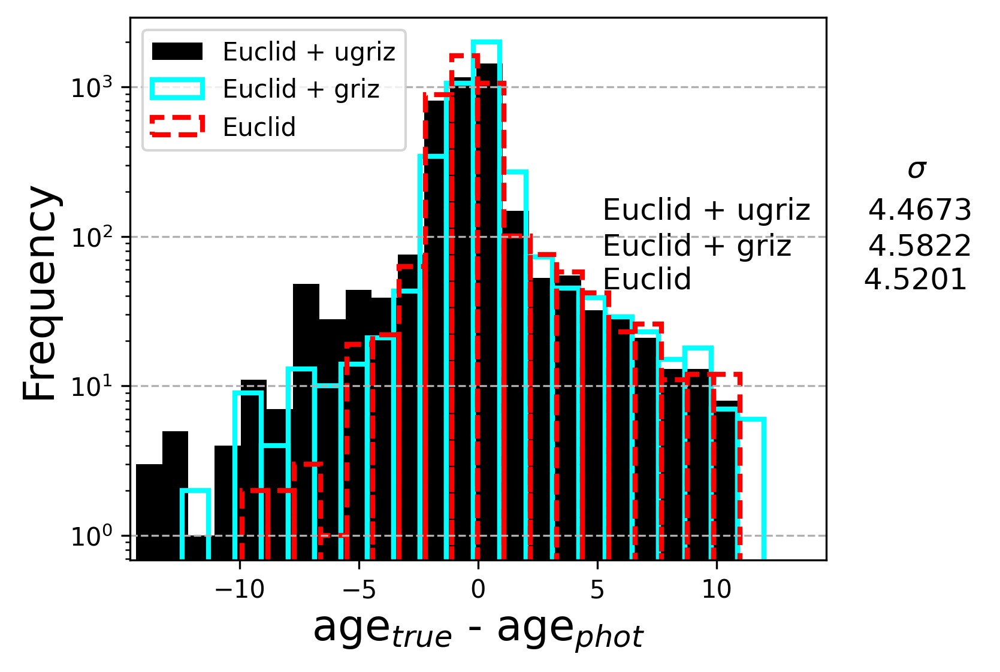

In [35]:
plt.figure(figsize=(5, 4), dpi=300)

plt.hist((df['t/Gyr'] - all_zphot[:, 6]), bins=100, log=True, color='k', label='Euclid + ugriz')
plt.hist((df['t/Gyr'] - grizVISYJH_zphot[:, 6]), bins=100, log=True, fill=False, edgecolor='cyan', lw=2, label='Euclid + griz')
plt.hist((df['t/Gyr'] - VISYJH_zphot[:, 6]), bins=100, log=True, ls='--', fill=False, edgecolor='r', lw=2, label='Euclid')

plt.grid(axis='y', ls='--')
plt.legend(loc='upper left')
plt.ylabel('Frequency', fontsize=17)
plt.xlabel(r'age$_{true}$ - age$_{phot}$', fontsize=17)


plt.text(5.2, 250, ('                                $\sigma$'), c='k', fontsize=12)

plt.text(5.2, 75, (r'Euclid + griz        %.4f' % (np.std((df['t/Gyr'] - grizVISYJH_zphot[:, 6])))), c='k', fontsize=12)

plt.text(5.2, 45, (r'Euclid                  %.4f ' % (np.std((df['t/Gyr'] - VISYJH_zphot[:, 6])))), c='k', fontsize=12)

plt.text(5.2, 130, (r'Euclid + ugriz      %.4f ' % (np.std((df['t/Gyr'] - all_zphot[:, 6])))), c='k', fontsize=12)

#plt.title('t/age accuracy for all model galaxies N = 1013', fontsize=15)

plt.xlim(-14.6, 14.6)

#plt.savefig('4051_figs/age_hist_2.png', dpi=300, transparent=False, format='png', bbox_inches='tight', pad_inches=1)

## Dust Reddening

In [54]:
reddening = df['Av'].values

In [70]:
print( (np.mean(reddening[av_mask] - all_zphot[av_mask, 7])) )
print( (np.mean(reddening[av_mask] - grizVISYJH_zphot[av_mask, 7])) )
print( (np.mean(reddening[av_mask] - VISYJH_zphot[av_mask, 7])) )

print( (np.std(reddening[av_mask] - all_zphot[av_mask, 7])) )
print( (np.std(reddening[av_mask] - grizVISYJH_zphot[av_mask, 7])) )
print( (np.std(reddening[av_mask] - VISYJH_zphot[av_mask, 7])) )

-0.2107741705315733
-0.11095255083838743
-0.2722797003210845
0.9865804212508041
1.0339671334563192
0.8534658167507903


(-3.0, 3.0)

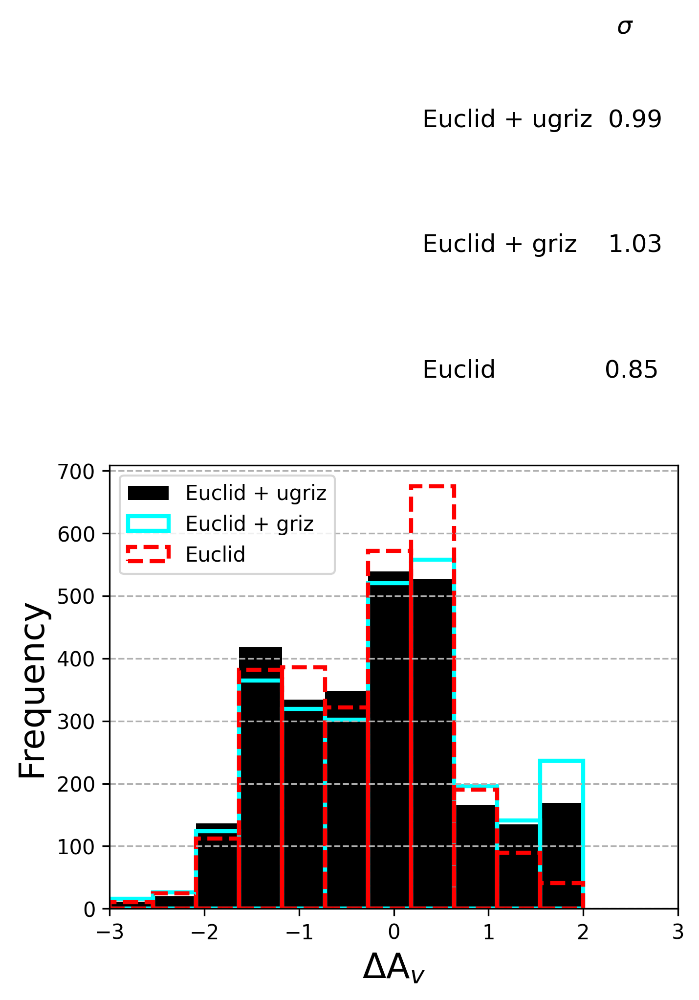

In [55]:
plt.figure(figsize=(5, 4), dpi=300)

plt.hist((reddening[av_mask] - all_zphot[av_mask, 7]), color='k', label='Euclid + ugriz', bins = 11)

plt.hist((reddening[av_mask] - grizVISYJH_zphot[av_mask, 7]),fill=False, edgecolor='cyan', lw=2, label='Euclid + griz', bins=11)

plt.hist((reddening[av_mask] - VISYJH_zphot[av_mask, 7]), ls='--', fill=False, edgecolor='r', lw=2, label='Euclid', bins=11)

plt.grid(axis='y', ls='--')
plt.legend(loc='upper left')
plt.ylabel('Frequency', fontsize=17)
plt.xlabel(r'$\Delta$A$_v$', fontsize=17)


#plt.text(0.3, 1400, ('                         $\sigma$'), c='k', fontsize=12)

#plt.text(0.3, 1050, (r'Euclid + griz    %.2f' % (np.std(reddening[av_mask] - grizVISYJH_zphot[av_mask, 7]))), c='k', fontsize=12)

#plt.text(0.3, 850, (r'Euclid              %.2f' % (np.std(reddening[av_mask] - VISYJH_zphot[av_mask, 7]))), c='k', fontsize=12)

#plt.text(0.3, 1250, (r'Euclid + ugriz  %.2f' % (np.std(reddening[av_mask] - all_zphot[av_mask, 7]))), c='k', fontsize=12)

#plt.title('A$_v$ accuracy for all model galaxies N = 1013', fontsize=15)

plt.xlim(-3, 3)

#plt.savefig('4051_figs/Av_hist_2.png', dpi=300, transparent=False, format='png', bbox_inches='tight', pad_inches=1)

## SFH

In [37]:
all_SFH = all_zphot[:, 4]
VISYJH_SFH = VISYJH_zphot[:, 4]
grizVISYJH_SFH = grizVISYJH_zphot[:, 4]

new_mar05_tau01.Z002.salp.ised   BC
/new_mar05_tau01.Z004.salp.ised   BC
/new_mar05_tau01.Z001.salp.ised   BC
/new_mar05_tau1.Z004.salp.ised  BC
/new_mar05_tau1.Z002.salp.ised  
/new_mar05_tau1.Z001.salp.ised  
/new_mar05_tau3.Z002.salp.ised  
/new_mar05_tau10.Z002.salp.ised 
/new_mar05_tau10.Z004.salp.ised 
/new_mar05_tau10.Z001.salp.ised 
/new_mar05_ssp.Z002.salp.ised

In [38]:
enumerate?

In [39]:
a = np.array([range(1, 12)], ndmin=2).T
b = np.array([0.1,0.1,0.1,1, 1, 1, 3, 10, 10, 10,np.nan],ndmin=2).T
c = np.array([0, 0.3, -0.3, 0.3, 0, -0.3, 0, 0, 0.3, -0.3, 0], ndmin=2).T

print(a.shape, b.shape, c.shape)

(11, 1) (11, 1) (11, 1)


In [40]:
SFH_lookup = np.hstack((a, b, c))

In [41]:
SFH_lookup[:, 0]

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11.])

In [42]:
new_all_zphot = np.zeros((all_zphot.shape[0],all_zphot.shape[1]+2)); new_all_zphot[:,:-2] = all_zphot

In [43]:
for i in range(len(all_zphot)):
    new_all_zphot[i, 21:] = SFH_lookup[(int(all_zphot[i, 4])-1), 1:]

In [44]:
new_grizVISYJH_zphot = np.zeros((grizVISYJH_zphot.shape[0],grizVISYJH_zphot.shape[1]+2)); new_grizVISYJH_zphot[:,:-2] = grizVISYJH_zphot

In [45]:
for i in range(len(grizVISYJH_zphot)):
    new_grizVISYJH_zphot[i, 21:] = SFH_lookup[(int(grizVISYJH_zphot[i, 4])-1), 1:]

In [46]:
new_VISYJH_zphot = np.zeros((VISYJH_zphot.shape[0],VISYJH_zphot.shape[1]+2)); new_VISYJH_zphot[:,:-2] = VISYJH_zphot

In [47]:
for i in range(len(VISYJH_zphot)):
    new_VISYJH_zphot[i, 21:] = SFH_lookup[(int(VISYJH_zphot[i, 4])-1), 1:]

In [48]:
print((df['tau/Gyr'] == new_VISYJH_zphot[:, 21]).value_counts(normalize=True),
(df['tau/Gyr'] == new_all_zphot[:, 21]).value_counts(normalize=True),
(df['tau/Gyr'] == new_grizVISYJH_zphot[:, 21]).value_counts(normalize=True))

False    0.843002
True     0.156998
Name: tau/Gyr, dtype: float64 False    0.800543
True     0.199457
Name: tau/Gyr, dtype: float64 False    0.818316
True     0.181684
Name: tau/Gyr, dtype: float64


In [49]:
print((df['Z'] == new_VISYJH_zphot[:, 22]).value_counts(normalize=True),
(df['Z'] == new_all_zphot[:, 22]).value_counts(normalize=True),
(df['Z'] == new_grizVISYJH_zphot[:, 22]).value_counts(normalize=True))

False    0.665515
True     0.334485
Name: Z, dtype: float64 False    0.663787
True     0.336213
Name: Z, dtype: float64 False    0.658109
True     0.341891
Name: Z, dtype: float64


In [58]:
true_sfh = df['tau/Gyr'].values

In [66]:
new_all_zphot[:, 21]

array([0.1, 0.1, 0.1, ..., 0.1, nan, 0.1])

In [65]:
print( (np.mean(true_sfh[av_mask] - new_all_zphot[av_mask, 21])) )
print( (np.mean(true_sfh[av_mask] - new_grizVISYJH_zphot[av_mask, 21])) )
print( (np.mean(true_sfh[av_mask] - new_VISYJH_zphot[av_mask, 21])) )

nan
nan
nan


/home/chris/.local/lib/python3.6/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/chris/.local/lib/python3.6/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


Text(0, 0.5, 'Frequency')

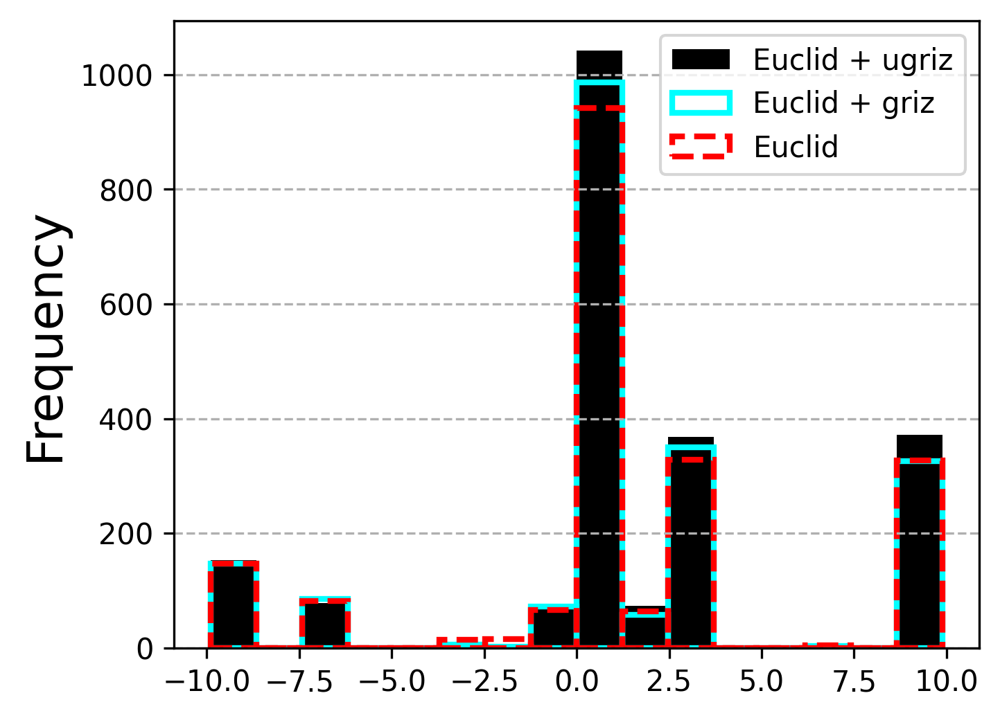

In [59]:
plt.figure(figsize=(5, 4), dpi=300)

plt.hist((true_sfh[av_mask] - new_all_zphot[av_mask, 21]), color='k', label='Euclid + ugriz', bins=16)

plt.hist((true_sfh[av_mask] - new_grizVISYJH_zphot[av_mask, 21]),fill=False, edgecolor='cyan', lw=2, label='Euclid + griz', bins=16)

plt.hist((true_sfh[av_mask] - new_VISYJH_zphot[av_mask, 21]), ls='--', fill=False, edgecolor='r', lw=2, label='Euclid', bins=16)

plt.grid(axis='y', ls='--')
plt.legend()
plt.ylabel('Frequency', fontsize=17)
#plt.xlabel(r'|A$_v$ - A$_v$|', fontsize=17)


#plt.text(1.5, 1050, ('Average |A$_v$ - A$_v$|'), c='k', fontsize=12)

#plt.text(1.5, 700, (r'Euclid + griz    %.2f' % (sum(abs(df['Av'] - grizVISYJH_zphot[av_mask, 7]))/4051)), c='k', fontsize=12)

#plt.text(1.5, 550, (r'Euclid              %.2f' % (sum(abs(df['Av'] - VISYJH_zphot[av_mask, 7]))/4051)), c='k', fontsize=12)

#plt.text(1.5, 850, (r'Euclid + ugriz  %.2f' % (sum(abs(df['Av'] - all_zphot[av_mask, 7]))/4051)), c='k', fontsize=12)

#plt.title('A$_v$ accuracy for all model galaxies N = 1013', fontsize=15)

#plt.xlim(0, 3)

#plt.savefig('new_model_figs/Av_hist.png', dpi=200, transparent=False, format='png', bbox_inches='tight', pad_inches=1)

/home/chris/.local/lib/python3.6/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/chris/.local/lib/python3.6/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


Text(0, 0.5, 'Frequency')

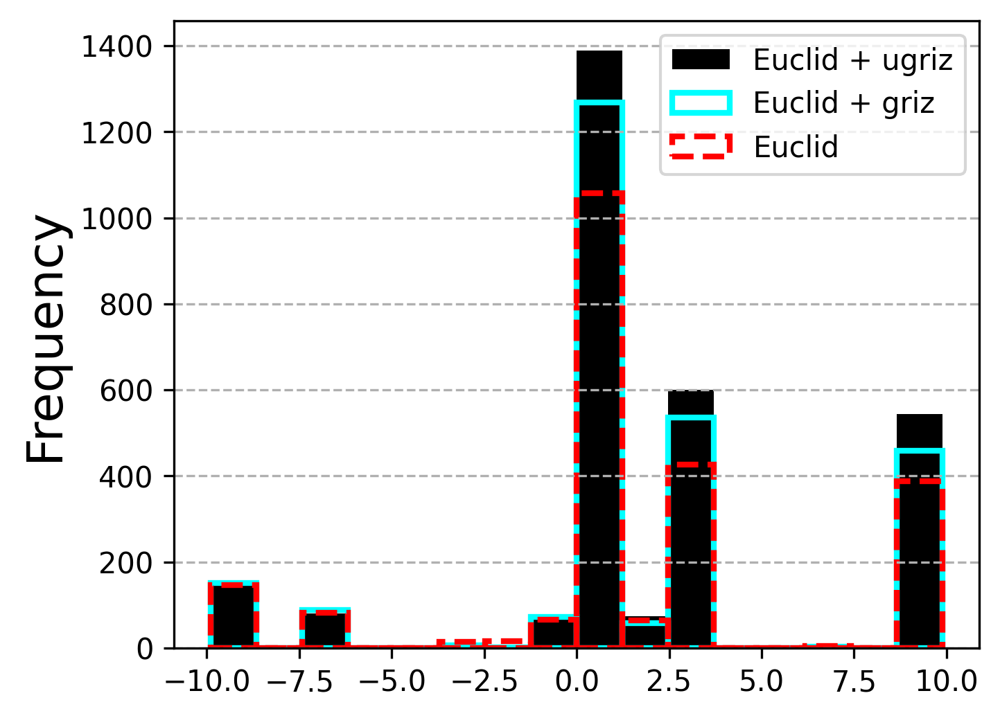

In [50]:
plt.figure(figsize=(5, 4), dpi=300)

plt.hist((df['tau/Gyr'] - new_all_zphot[:, 21]), color='k', label='Euclid + ugriz', bins=16)

plt.hist((df['tau/Gyr'] - new_grizVISYJH_zphot[:, 21]),fill=False, edgecolor='cyan', lw=2, label='Euclid + griz', bins=16)

plt.hist((df['tau/Gyr'] - new_VISYJH_zphot[:, 21]), ls='--', fill=False, edgecolor='r', lw=2, label='Euclid', bins=16)

plt.grid(axis='y', ls='--')
plt.legend()
plt.ylabel('Frequency', fontsize=17)
#plt.xlabel(r'|A$_v$ - A$_v$|', fontsize=17)


#plt.text(1.5, 1050, ('Average |A$_v$ - A$_v$|'), c='k', fontsize=12)

#plt.text(1.5, 700, (r'Euclid + griz    %.2f' % (sum(abs(df['Av'] - grizVISYJH_zphot[:, 7]))/4051)), c='k', fontsize=12)

#plt.text(1.5, 550, (r'Euclid              %.2f' % (sum(abs(df['Av'] - VISYJH_zphot[:, 7]))/4051)), c='k', fontsize=12)

#plt.text(1.5, 850, (r'Euclid + ugriz  %.2f' % (sum(abs(df['Av'] - all_zphot[:, 7]))/4051)), c='k', fontsize=12)

#plt.title('A$_v$ accuracy for all model galaxies N = 1013', fontsize=15)

#plt.xlim(0, 3)

#plt.savefig('new_model_figs/Av_hist.png', dpi=200, transparent=False, format='png', bbox_inches='tight', pad_inches=1)

In [56]:
met = df['Z'].values

In [68]:
print( (np.mean(met[av_mask] - new_all_zphot[av_mask, 22])) )
print( (np.mean(met[av_mask] - new_grizVISYJH_zphot[av_mask, 22])) )
print( (np.mean(met[av_mask] - new_VISYJH_zphot[av_mask, 22])) )

print( (np.std(met[av_mask] - new_all_zphot[av_mask, 22])) )
print( (np.std(met[av_mask] - new_grizVISYJH_zphot[av_mask, 22])) )
print( (np.std(met[av_mask] - new_VISYJH_zphot[av_mask, 22])) )

-0.026435961469853726
-0.029967891544773455
-0.015947199429183018
0.33719959358418133
0.3299221505759876
0.32179546699383343


In [69]:
print( (np.mean(met[:] - new_all_zphot[:, 22])) )
print( (np.mean(met[:] - new_grizVISYJH_zphot[:, 22])) )
print( (np.mean(met[:] - new_VISYJH_zphot[:, 22])) )

print( (np.std(met[:] - new_all_zphot[:, 22])) )
print( (np.std(met[:] - new_grizVISYJH_zphot[:, 22])) )
print( (np.std(met[:] - new_VISYJH_zphot[:, 22])) )

0.014440878795359168
-0.0016292273512712896
-0.028511478647247592
0.33672783564412045
0.3272338858828318
0.30909720518844164


(-1.0, 1.0)

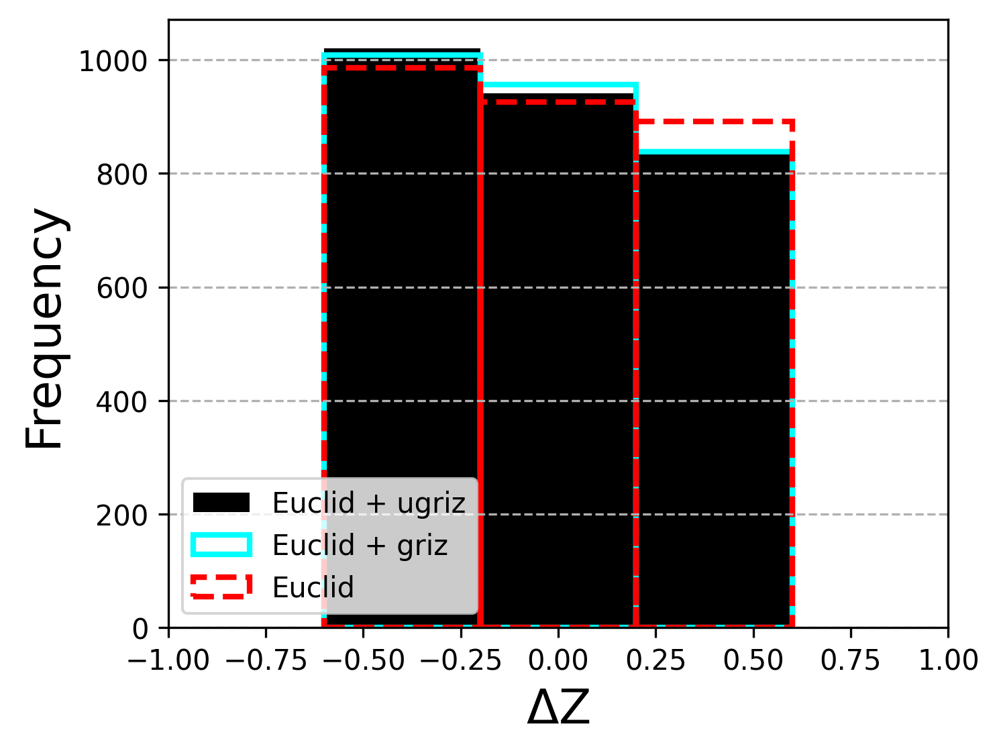

In [57]:
plt.figure(figsize=(5, 4), dpi=300)

plt.hist((met[av_mask] - new_all_zphot[av_mask, 22]), color='k', label='Euclid + ugriz', bins=3)

plt.hist((met[av_mask] - new_grizVISYJH_zphot[av_mask, 22]),fill=False, edgecolor='cyan', lw=2, label='Euclid + griz', bins=3)

plt.hist((met[av_mask] - new_VISYJH_zphot[av_mask, 22]), ls='--', fill=False, edgecolor='r', lw=2, label='Euclid', bins=3)

plt.grid(axis='y', ls='--')
plt.legend(loc='lower left')
plt.ylabel('Frequency', fontsize=17)
plt.xlabel('$\Delta$Z', fontsize=17)
plt.xlim(-1,1)

(-1.0, 1.0)

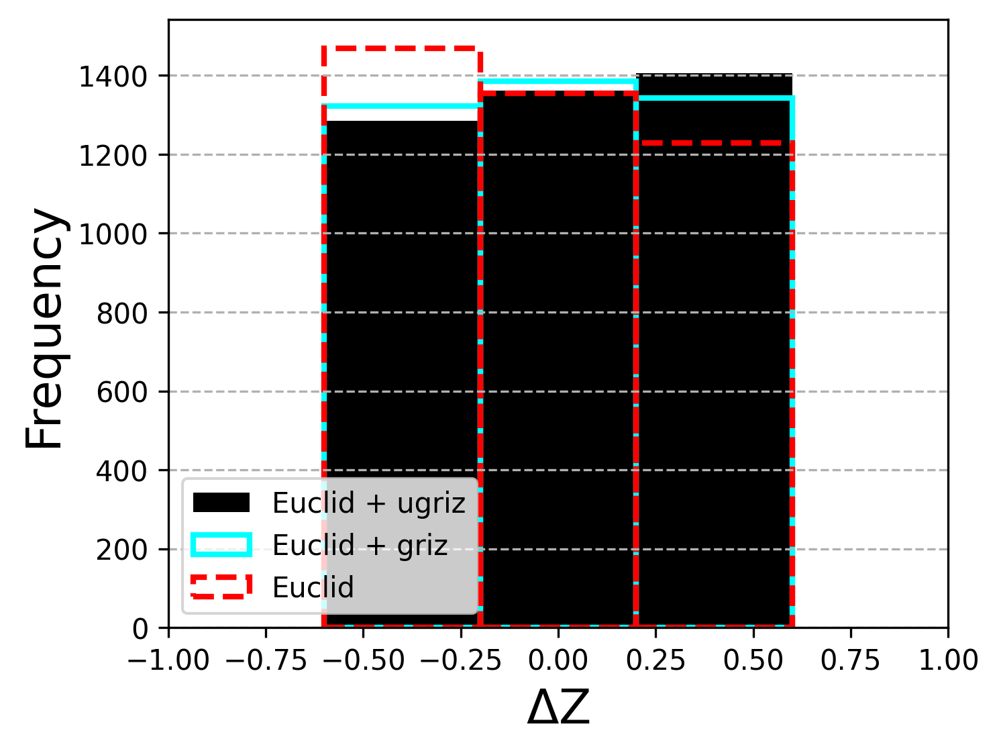

In [51]:
plt.figure(figsize=(5, 4), dpi=300)

plt.hist((df['Z'] - new_all_zphot[:, 22]), color='k', label='Euclid + ugriz', bins=3)

plt.hist((df['Z'] - new_grizVISYJH_zphot[:, 22]),fill=False, edgecolor='cyan', lw=2, label='Euclid + griz', bins=3)

plt.hist((df['Z'] - new_VISYJH_zphot[:, 22]), ls='--', fill=False, edgecolor='r', lw=2, label='Euclid', bins=3)

plt.grid(axis='y', ls='--')
plt.legend(loc='lower left')
plt.ylabel('Frequency', fontsize=17)
plt.xlabel('$\Delta$Z', fontsize=17)
plt.xlim(-1,1)